In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import torch
import math
from functools import partial
from matplotlib import pyplot as plt
import random
import seaborn as sns
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import Axes3D
from pathlib import Path

import jax
import jax.numpy as jnp
from jax import grad, jit, vmap, jacobian

from sklearn.linear_model import LinearRegression
from tqdm import tqdm

from easydict import EasyDict as edict

from src.kernel_estimation import (
    Lambda,
    gauss,
    compute_lambda_d,
    Kernel,
    kernel_estimator,
    plot_kernels)

from src.manifolds import (
    example_1d_density,
    compute_norm_constant,
    plot_example_1d_density,
    plot_example_1d_densities,
    example_1d_density_sampling,
    example_parametric_curve,

    example_2d_density,
    example_2d_density_sampling,
    plot_example_2d_density,
    example_parametric_surface

)

from src.utils import (collect_mse_convergence,
    collect_mse_convergence_adaptation,
    plot_convergence)

key = jax.random.PRNGKey(0)

pi = np.pi


In [2]:
!rm -r figs
!mkdir figs

In [3]:
figpath = Path('figs')

## Kernels

In [4]:
x = torch.linspace(-1.5, 1.5, 100).unsqueeze(-1)

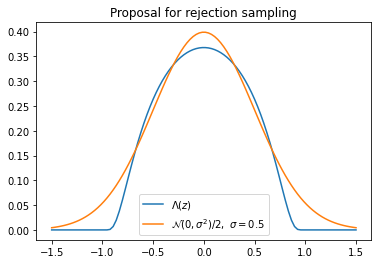

In [5]:
plt.plot(x[:, 0], Lambda(x), label=r'$\Lambda(z)$')
plt.plot(x[:, 0], gauss(x)/2, label=r'$\mathcal{N}(0, \sigma^2) / 2, ~\sigma=0.5$')

plt.title('Proposal for rejection sampling')
plt.legend()
plt.show()

In [6]:
lambda_d = compute_lambda_d(1)

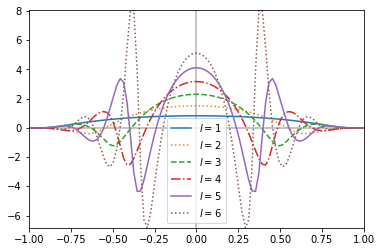

In [7]:
plot_kernels(1,2,3,4,5,6, savepath='figs/kernels.png')

 ## 1d submanifold

In [8]:
min_value, max_value = -.5, .5

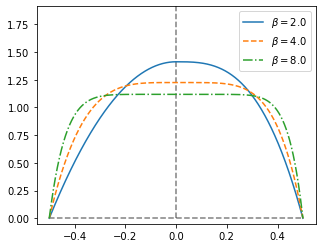

In [9]:
plot_example_1d_densities(savepath='figs/1d_densities.png', lamda=1.)

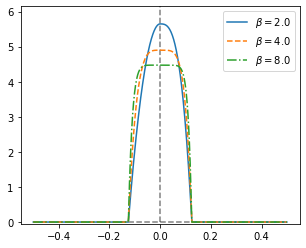

In [10]:
plot_example_1d_densities(savepath='figs/1d_densities.png', lamda=4.)

In [11]:
pts = example_1d_density_sampling(2., int(1e4), lamda=1.)

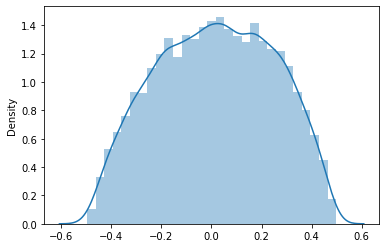

In [12]:
sns.distplot(pts.tolist())
plt.show()

In [13]:
a = 1./8
w = 6

In [14]:
grad_f = vmap(jax.jacobian(partial(example_parametric_curve, a=a, w=w)))


In [15]:
linsp = torch.linspace(0, 1, 1000)


manifold_pts = example_parametric_curve(linsp, a=a, w=w)

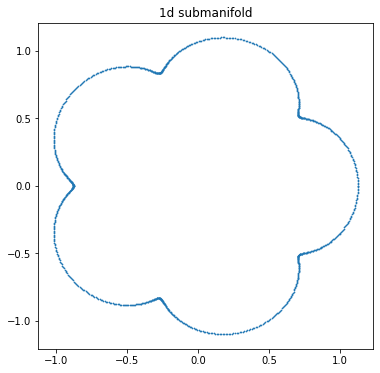

In [16]:
fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)
plt.title('1d submanifold')
plt.show()

In [17]:
beta = 3.

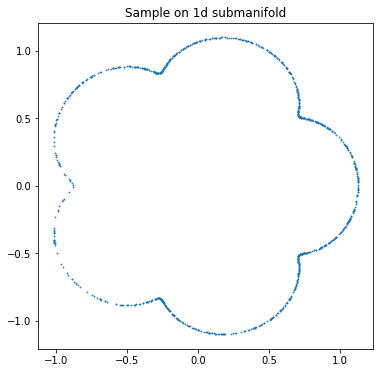

In [18]:
lamda = 1.

pts = example_1d_density_sampling(beta, int(1e3), lamda=lamda)
manifold_pts = example_parametric_curve(pts, a=1./8, w=6.)

fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)
plt.title('Sample on 1d submanifold')
plt.show()

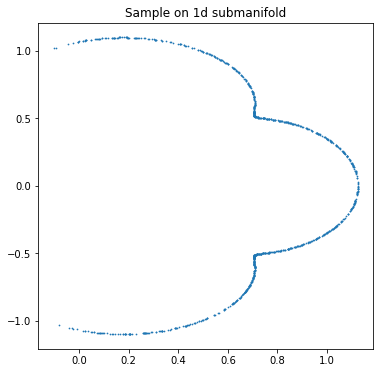

In [19]:
lamda = 2.

pts = example_1d_density_sampling(beta, int(1e3), lamda=lamda)
manifold_pts = example_parametric_curve(pts, a=1./8, w=6.)

fig = plt.figure(figsize=(6,6))
plt.scatter(manifold_pts[:, 0], manifold_pts[:, 1], s=.5)
plt.title('Sample on 1d submanifold')
plt.show()

In [20]:
def submanifold_density(v):
    transformed = example_parametric_curve(v, a=a, w=w)
    grad = grad_f(jnp.array(v.numpy()))[:, 0, :]
    #print(grad.shape)
    grad = torch.tensor(np.array(grad))

    unnormed_g = partial(example_1d_density, beta=beta, lamda=lamda)
    norm_const = compute_norm_constant(unnormed_g, min_value, max_value)
    dens = example_1d_density(v, beta=beta, lamda=lamda) / grad.norm(p=2, dim=-1) / norm_const

    return dens

In [21]:
dens = submanifold_density(pts)
dens = dens.detach().cpu().numpy()
# print(dens.max(), dens.sum())

In [22]:
x = torch.tensor([0.])

submanifold_density(x)

tensor([0.2347])

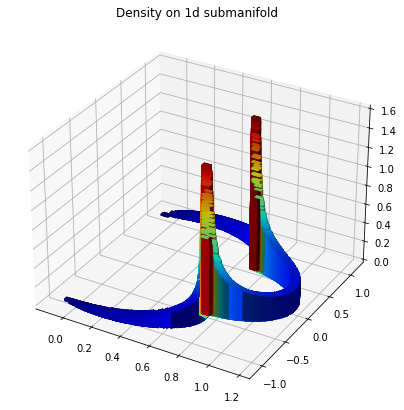

In [23]:
import matplotlib.colors as colors

fig = plt.figure(figsize=(7, 7))
ax1 = fig.add_subplot(111, projection='3d')
#ax2 = fig.add_subplot(122, projection='3d')

offset = dens + np.abs(dens.min())
fracs = offset.astype(float)/offset.max()
norm = colors.Normalize(fracs.min(), fracs.max())
colors = cm.jet(norm(fracs))

ax1.bar3d(manifold_pts[:, 0], manifold_pts[:, 1], 0, 0.05, 0.05, dens, shade=True, color=colors)

plt.title('Density on 1d submanifold')
plt.show()

In [24]:
a = 1./8
one_d_args = edict(dict(d=1, a=1./8, w=6., beta=2., x=torch.tensor([1. + a, 0.]), expected_rate=-.8))

unnormed_g = partial(example_1d_density, beta=one_d_args.beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

def density_at_zero(norm_const, a, w):
    return 1. / (norm_const * 2 * pi * (1. + a * w))

f_gt = density_at_zero(norm_const, one_d_args.a, one_d_args.w)

one_d_args.f_gt = f_gt

def sample_f(beta, n_pts):
    pts = example_1d_density_sampling(beta, int(n_pts))
    manifold_pts = example_parametric_curve(pts, a=one_d_args.a, w=one_d_args.w)
    return manifold_pts

one_d_args.sample_f = sample_f

## Convergence

In [25]:
args = one_d_args

21it [00:13,  1.51it/s]
Estimated rate: -0.7980, expected rate: -0.8


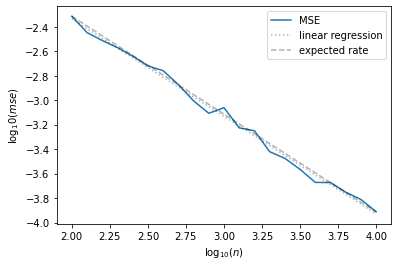

In [26]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = args.beta

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/1d_manifold_experiment_l={int(l)}.png')

11it [02:33, 13.96s/it]
Estimated rate: -0.8083, expected rate: -0.8


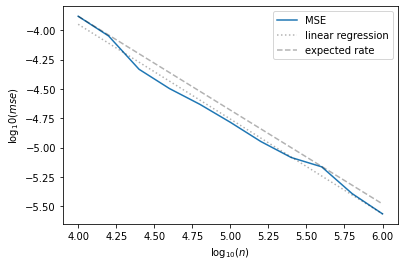

In [27]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)

coef, bias, mse_n = collect_mse_convergence(one_d_args.beta, kernel, one_d_args.sample_f, one_d_args.x, one_d_args.f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/1d_manifold_2_experiment_l={int(l)}.png')

11it [03:57, 21.56s/it]
Estimated rate: -0.8095, expected rate: -0.8


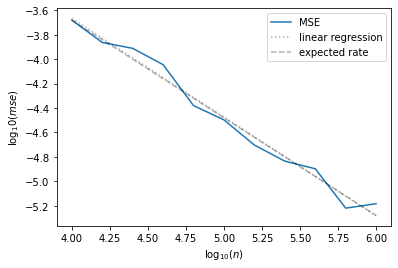

In [28]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)

l = 3.

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/1d_manifold_2_experiment_l={int(l)}.png')

## 2d manifold example

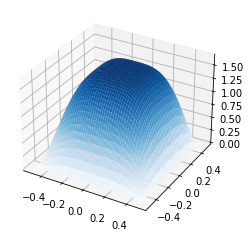

In [29]:
fig = plt.figure()
ax = fig.gca(projection='3d')

surf = plot_example_2d_density(ax, 3.)

#fig.colorbar(surf, shrink=0.5, aspect=5)
plt.savefig('figs/2d_density.png')

In [30]:
b = 3
w = 5

In [31]:
min_value, max_value = -.5, .5

In [32]:
linsp_x = torch.linspace(min_value, max_value, 1000)
linsp_y = torch.linspace(min_value, max_value, 1000)
mesh = torch.meshgrid(linsp_x, linsp_y)

v = mesh[0].reshape(-1)
u = mesh[1].reshape(-1)


manifold_pts = example_parametric_surface(v, u, a=a, b=b, w=w)

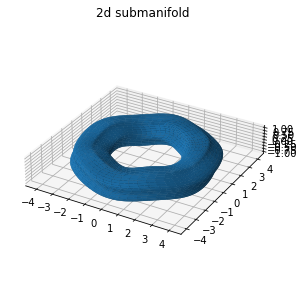

In [33]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')

manifold_pts = manifold_pts.reshape(1000, 1000, 3)

scale = np.diag([4., 4., 1., 1])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), scale)

ax.plot_surface(manifold_pts[:, :, 0], manifold_pts[:, :, 1], manifold_pts[:, :, 2].numpy())

plt.title('2d submanifold')
plt.show()

In [34]:
pts = example_2d_density_sampling(beta, int(1e3), lamda=1.)
manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a, b, w)

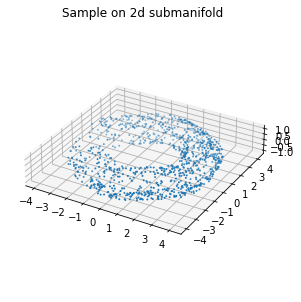

In [35]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection='3d')

#manifold_pts = manifold_pts.reshape(1000, 1000, 3)

scale = np.diag([4., 4., 1., 1])
scale=scale*(1.0/scale.max())
scale[3,3]=1.0
ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), scale)


ax.scatter(manifold_pts[:, 0], manifold_pts[:, 1], manifold_pts[:, 2].numpy(), s=1.)

plt.title('Sample on 2d submanifold')
plt.show()

In [36]:
a = 1./8
b = 3
w = 5
lamda = 1.

two_d_args = edict(dict(d=2, a=a, b=b, w=w, beta=2., lamda=lamda, x=torch.tensor([1. + b, a, 0.]), expected_rate=-.667))

def density_at_zero(norm_const, lamda, a, b, w):
    return lamda**2 / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

unnormed_g = partial(example_1d_density, lamda=two_d_args.lamda, beta=two_d_args.beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

f_gt = density_at_zero(norm_const, lamda, two_d_args.a, two_d_args.b, two_d_args.w)


def sample_f(beta, n_pts):
    pts = example_2d_density_sampling(beta, int(n_pts), lamda=two_d_args.lamda)
    manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=two_d_args.a, b=two_d_args.b, w=two_d_args.w)

    return manifold_pts

two_d_args.f_gt = f_gt
two_d_args.sample_f = sample_f

In [37]:
args = two_d_args

21it [00:19,  1.05it/s]
Estimated rate: -0.6848, expected rate: -0.667


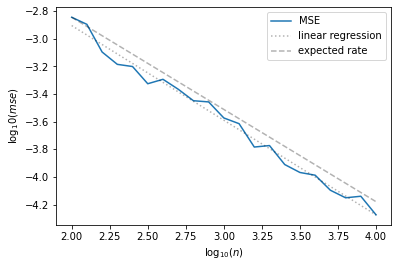

In [38]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 21)
#beta = 2
l = args.beta

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_experiment_l={int(l)}.png')

11it [03:41, 20.18s/it]
Estimated rate: -0.7001, expected rate: -0.667


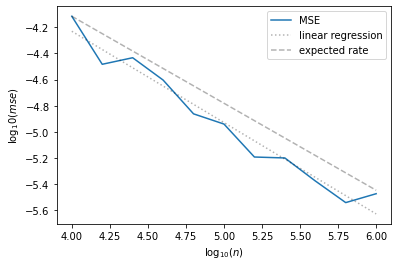

In [39]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)

coef, bias, mse_n = collect_mse_convergence(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N) #, f_max, theta)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_2_experiment_l={int(l)}.png', error_name='MSE')

11it [05:07, 27.95s/it]
Estimated rate: -0.6545, expected rate: -0.667


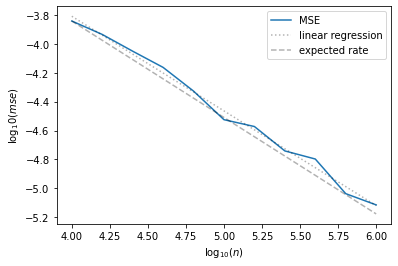

In [40]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e6) / np.log(10), 11)
l = 3

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_2_experiment_l={int(l)}.png', error_name='MSE')

## Adaptation

In [41]:
pts = example_1d_density_sampling(one_d_args.beta, int(1e4))
one_d_args.f_max = submanifold_density(pts).max().item()


In [42]:
args = one_d_args

1it [00:00,  2.11it/s]mean selected bandwidth: 1.0000, optimal: 0.3981
2it [00:01,  1.91it/s]mean selected bandwidth: 1.0000, optimal: 0.3633
3it [00:02,  1.49it/s]mean selected bandwidth: 1.0000, optimal: 0.3312
4it [00:03,  1.05it/s]mean selected bandwidth: 1.0000, optimal: 0.3020
5it [00:06,  1.39s/it]mean selected bandwidth: 1.0000, optimal: 0.2755
6it [00:09,  2.09s/it]mean selected bandwidth: 1.0000, optimal: 0.2512
7it [00:15,  3.10s/it]mean selected bandwidth: 1.0000, optimal: 0.2291
8it [00:24,  5.01s/it]mean selected bandwidth: 1.0000, optimal: 0.2089
9it [00:39,  7.87s/it]mean selected bandwidth: 1.0000, optimal: 0.1905
10it [01:01, 12.17s/it]mean selected bandwidth: 1.0000, optimal: 0.1738
11it [01:38,  8.91s/it]mean selected bandwidth: 1.0000, optimal: 0.1585
Estimated rate: -0.9519, expected rate: -0.8



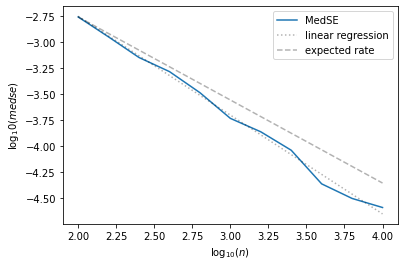

In [43]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 11)

l = 3
theta = 2.
psy_type = 1

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence_adaptation(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N, args.f_max, theta, psy_type=psy_type)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/1d_manifold_adaptation_experiment_l={int(l)}.png', error_name='MedSE')

In [44]:
# N = 100
# grid = np.logspace(np.log(1e4) / np.log(10), np.log(1e5) / np.log(10), 5)

# l = 3.
# theta = 2.
# psy_type = 1 

# kernel = Kernel(l, args.d)

# coef, bias, mse_n = collect_mse_convergence_adaptation(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N, args.f_max, theta, psy_type=psy_type)
# grid = grid[:len(mse_n)]

# print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

# plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/1d_manifold_adaptation_2_experiment_l={int(l)}.png', error_name='MedSE')

In [45]:
lamda = 1.
two_d_args.lamda = lamda

def density_at_zero(norm_const, lamda, a, b, w):
    return lamda**2 / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

unnormed_g = partial(example_1d_density, lamda=two_d_args.lamda, beta=two_d_args.beta)
norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)

f_gt = density_at_zero(norm_const, two_d_args.lamda, two_d_args.a, two_d_args.b, two_d_args.w)

def sample_f(beta, n_pts):
    pts = example_2d_density_sampling(beta, int(n_pts), lamda=two_d_args.lamda)
    manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=two_d_args.a, b=two_d_args.b, w=two_d_args.w)

    return manifold_pts

two_d_args.f_gt = f_gt
two_d_args.sample_f = sample_f

In [46]:
two_d_args.f_max = two_d_args.f_gt.item()

In [47]:
f_gt

tensor(0.0107)

In [48]:
# expected_rate = -.667
# d = 2
# beta = 2.
# w = 5

# x = torch.tensor([1. + b, a, 0.])

# def density_at_zero(norm_const, lamda, a, b, w):
#     return lamda**2 / (norm_const * 2 * pi)**2 * ((1. + a**2 * w**2) * ((b+1)**2 + a**2*w**2) - a**2*w**2)**(-.5)

# lamda = 1.

# unnormed_g = partial(example_1d_density, beta=beta, lamda=lamda)
# norm_const = compute_norm_constant(unnormed_g, -.5, .5, n_pts=10000)


# f_gt = density_at_zero(norm_const, lamda, a, b, w)


# def sample_f(beta, n_pts):
#     pts = example_2d_density_sampling(beta, int(n_pts), lamda=lamda)
#     manifold_pts = example_parametric_surface(pts[:, 0], pts[:, 1], a=a, b=b, w=w)

#     return manifold_pts

In [49]:
args = two_d_args

1it [00:00,  2.41it/s]mean selected bandwidth: 0.9961, optimal: 0.4642
2it [00:01,  2.06it/s]mean selected bandwidth: 1.0000, optimal: 0.4301
3it [00:02,  1.52it/s]mean selected bandwidth: 0.9986, optimal: 0.3982
4it [00:03,  1.07it/s]mean selected bandwidth: 1.0000, optimal: 0.3687
5it [00:06,  1.40s/it]mean selected bandwidth: 1.0000, optimal: 0.3415
6it [00:10,  2.20s/it]mean selected bandwidth: 0.9962, optimal: 0.3162
7it [00:16,  3.27s/it]mean selected bandwidth: 1.0000, optimal: 0.2929
8it [00:25,  5.00s/it]mean selected bandwidth: 1.0000, optimal: 0.2712
9it [00:40,  8.12s/it]mean selected bandwidth: 0.9967, optimal: 0.2512
10it [01:03, 12.47s/it]mean selected bandwidth: 0.9981, optimal: 0.2326
11it [01:40,  9.11s/it]mean selected bandwidth: 0.9960, optimal: 0.2154
Estimated rate: -0.9894, expected rate: -0.667



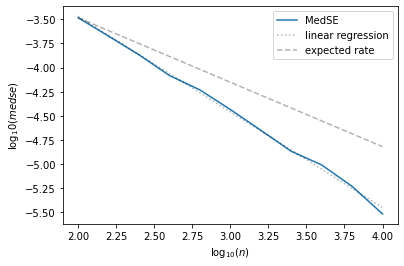

In [50]:
N = 500
grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 11)

l = 3
theta = 2.
psy_type = 2

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence_adaptation(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N, args.f_max, theta, psy_type=psy_type)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_adaptation_experiment_l={int(l)}.png', error_name='MedSE')

1it [00:07,  7.52s/it]mean selected bandwidth: 1.0000, optimal: 0.2154
2it [00:18,  8.65s/it]mean selected bandwidth: 0.9900, optimal: 0.2018
3it [00:34, 10.84s/it]mean selected bandwidth: 1.0000, optimal: 0.1891
4it [00:58, 14.63s/it]mean selected bandwidth: 0.9716, optimal: 0.1772
5it [01:32, 20.47s/it]mean selected bandwidth: 0.9707, optimal: 0.1660
6it [02:22, 29.37s/it]mean selected bandwidth: 0.9900, optimal: 0.1555
7it [03:36, 42.92s/it]mean selected bandwidth: 0.9638, optimal: 0.1457
8it [05:29, 63.90s/it]mean selected bandwidth: 0.9801, optimal: 0.1365
9it [08:14, 94.25s/it]mean selected bandwidth: 0.9406, optimal: 0.1279
10it [12:17, 138.63s/it]mean selected bandwidth: 0.9815, optimal: 0.1198
11it [18:02, 98.43s/it] mean selected bandwidth: 1.0000, optimal: 0.1122
Estimated rate: -0.6480, expected rate: -0.667



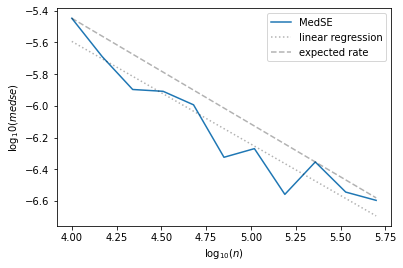

In [51]:
N = 100
grid = np.logspace(np.log(1e4) / np.log(10), np.log(5e5) / np.log(10), 11)

l = 3
theta = 2.
psy_type = 2

kernel = Kernel(l, args.d)

coef, bias, mse_n = collect_mse_convergence_adaptation(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N, theta, args.f_max, psy_type = psy_type)
grid = grid[:len(mse_n)]

print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_adaptation_2_experiment_l={int(l)}.png', error_name='MedSE')

In [52]:
# N = 500
# grid = np.logspace(np.log(100) / np.log(10), np.log(1e4) / np.log(10), 11)

# l = 2
# theta = 2.

# kernel = Kernel(l, args.d)

# coef, bias, mse_n = collect_mse_convergence_adaptation(args.beta, kernel, args.sample_f, args.x, args.f_gt, grid, N, theta, args.f_max)
# grid = grid[:len(mse_n)]

# print(f'Estimated rate: {coef[0]:.4f}, expected rate: {args.expected_rate}')

# plot_convergence(grid, mse_n, coef, bias, args.expected_rate, savepath=f'figs/2d_manifold_adaptation_3_experiment_l={int(l)}.png', error_name='MedSE')